# Домашнее задание 3. Детекция объектов

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом, и точно не будет работать из коробки на Windows.

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q torchmetrics
!pip install -q tensorboard
!pip install -q torchinfo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 10.1 MB/s eta 0:00:00


In [ ]:
import math
import os
import random
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
from torch import nn
from torch.nn import functional as F
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchmetrics.functional import accuracy
from torchvision.datasets import ImageFolder
from tqdm import tqdm


from sklearn.metrics import accuracy_score
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchinfo import summary
from torch.utils.tensorboard import SummaryWriter

# from typing import List
from collections import defaultdict

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# You may add any imports you need

from warnings import filterwarnings
filterwarnings("ignore")

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [ ]:
# Harry Potter -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip



!unzip -q data.zip

--2023-12-06 20:45:38--  https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip [following]
--2023-12-06 20:45:38--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17592727 (17M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  16.78M  --.-KB/s    in 0.1s    

2023-12-06 20:45:38 (122 MB/s) - ‘data.zip’ saved [17592727/17592727]



# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

In [ ]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

In [ ]:
import random
import os

def seed_everything(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True


seed_everything(42)

In [ ]:
tree = ET.parse("/content/data/xmls/0.xml")
treeroot = tree.getroot()

In [ ]:
def get_xml_data(image_name: str, root, class_dict: dict, xml_prefix: str="/xmls/") -> dict:
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("/")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
        # you need: xmin ymin xmax ymax, class in dict
        name = member.find("name").text
        xmin = int(member.find("bndbox/xmin").text)
        ymin = int(member.find("bndbox/ymin").text)
        xmax = int(member.find("bndbox/xmax").text)
        ymax = int(member.find("bndbox/ymax").text)

        class_id = class_dict.get(name)
        if class_id is not None:
            res = {
                "xmin": xmin,
                "ymin": ymin,
                "xmax": xmax,
                "ymax": ymax,
                "class": class_id
            }

        bboxes.append(res)

    return bboxes

In [ ]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9): ]
            ].tolist()

    def __getitem__(self, idx):
        ### YOUR CODE HERE ###

        fname = self.filenames[idx]
        image = Image.open(fname).convert("RGB")
        bboxes = get_xml_data(fname, self.root, self.class_dict)
        albumentations_bboxes = [[box["xmin"], box["ymin"], box["xmax"], box["ymax"], box["class"]] for box in bboxes]

        return self.transform(image=np.array(image), bboxes=albumentations_bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        ### YOUR CODE HERE ###
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [ ]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [ ]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

In [ ]:
def visualize(images, bboxes: dict):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):
        if isinstance(bboxes, dict):
            j = i + 1
        else:
            j = i

        ax.axis(False)

        if i >= len(images):
            break
        # Вот тут нужно выполнить permute (вспомните где у torch каналы, а где они у matplotlib)
        # И откатить нормализацию (просто обратное преобразование)
        # Имена и количества классов можно подтянуть из датасета через train_ds.class_dict_inv
        img = images[i].permute(1, 2, 0).numpy()
        img = (img * std + mean) * 255
        img = img.astype(np.uint8)

        ax.imshow(img)

        for bbox in bboxes[j]:
        ### YOUR CODE HERE ###
        # for visaulisation of custom predictions, there is need to know
        # the mapping between particular bbox and the image that correspond to it
            xmin, ymin, xmax, ymax, class_id = bbox

            if isinstance(bbox, torch.Tensor):
                xmin, ymin, xmax, ymax, class_id = list(map(int, bbox.tolist()))
                # w = xmax - xmin
                # h = ymax - ymin
                # h_img, w_img = img.shape

                # xmin =

            class_name = train_ds.class_dict_inv[class_id]
            ax.annotate(
                class_name,
                (xmin + 0.5 * (xmax - xmin), ymin + 0.5 * (ymax - ymin)),
                color="white",
                fontsize=8,
                ha="center",
                va="center",
            )
            ax.add_patch(
                plt.Rectangle(
                    (xmin, ymin),
                    xmax - xmin,
                    ymax - ymin,
                    fill=False,
                    edgecolor="red",
                    linewidth=2,
                )
            )

    fig.tight_layout()
    plt.show()

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://gcdnb.pbrd.co/images/n8BnhhfCgYnQ.png)

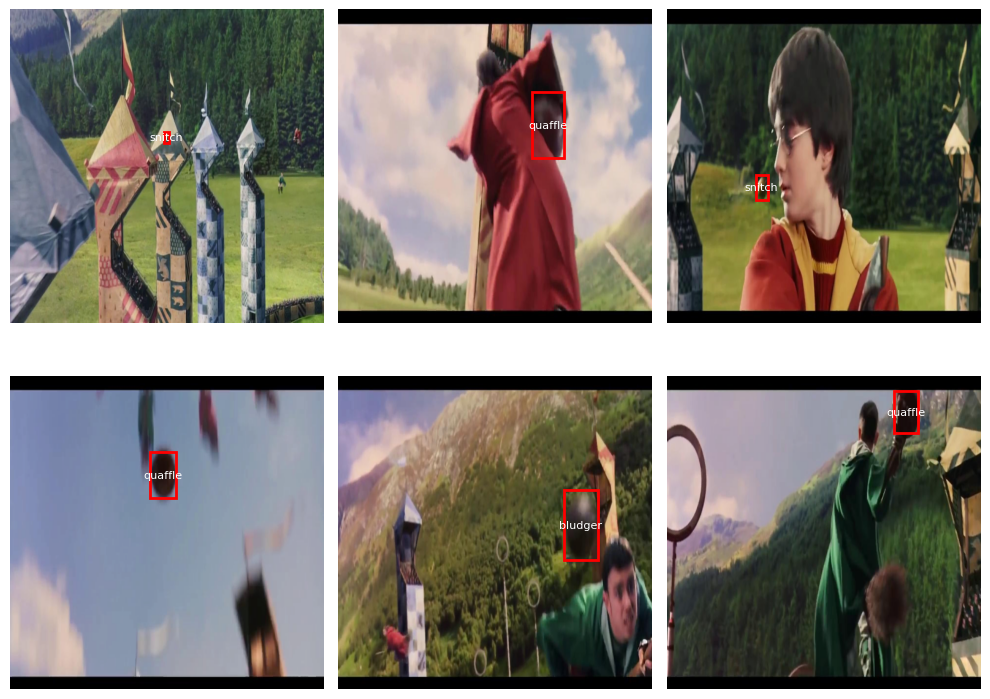

In [ ]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO

Сейчас нам предстоить реализовать YOLO детектор. Это один из самых простых детекторов с точки зрения реализации. Он описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Мы будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16. В каждом пикселе мы будем предсказывать размеры прямоугольника и класс.



We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и сгенерировать тензор размера Bx16x16x6 (а в коде наоборот :/). Первая размерность - это количество примеров в батче. Далее идут две пространственные размерности. **В каналах** у нас будут записаны координаты центра, центр относительно координат пикселя, бинарная переменная (детекция присутствует), класс детекции.

In [ ]:
def collate_fn(batch: list[dict], downsample: int=32) -> dict:
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample) # [8, 6, 16, 16]

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):
        # it can be several boxes in one batch

        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )
        # Нормализуйте ширину и высоту, поделив на ширину и высоту исходного изображения
        x_cell = w / 16 # TODO размер клетки по X в пикс
        y_cell = h / 16 # TODO размер клетки по Y в пикс
        w_box =  (xmax - xmin) / w # TODO ширина бокса отнормированная
        h_box =  (ymax - ymin) / h # TODO высота бокса отнормированная

        # Посчитайте координаты центра и сдвиги
        cx = ((xmin + xmax) / 2) # .unsqueeze(0).T # TODO (координаты центра в исходных координатах)
        cy = ((ymin + ymax) / 2) # .unsqueeze(0).T
        x_coords = torch.linspace(0, w, 16).unsqueeze(0)
        y_coords = torch.linspace(0, h, 16).unsqueeze(0)

        cx_idx = torch.sum(x_coords < cx, dim=1) - 1 # cx // x_cell # torch.sum(x_coords < cx, dim=1) - 1 # TODO (посчитайте индекс центра на карте признаков размера 16x16. Это будут как раз координаты пикселя, куда мы запишем параметры коробки)
        cy_idx =  torch.sum(y_coords < cy, dim=1) - 1 # cy // y_cell # torch.sum(y_coords < cy, dim=1) - 1 # TODO
        cx_box = (cx.T.squeeze(0) - torch.Tensor([x_coords[:, i] for i in cx_idx])) / x_cell # TODO (посчитайте сдивиги относительно cx_idx)
        cy_box = (cy.T.squeeze(0) - torch.Tensor([y_coords[:, j] for j in cy_idx])) / y_cell # TODO
        # cx_box = cx % x_cell
        # cy_box = cy % y_cell

        # add all existed boxes:
        if len(classes.shape):
            for j in range(len(classes)):
                # print(i, cx_idx[j], cy_idx[j])
                target[i, :, int(cy_idx[j].item()), int(cx_idx[j].item())] = torch.stack(
            [cx_box[j], cy_box[j], w_box[j], h_box[j], torch.ones_like(cx_box[j]), classes[j]]
            )
        else:
            target[i, :, int(cy_idx), int(cx_idx)] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
            )

    return {"image": imgs, "target": target}

Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

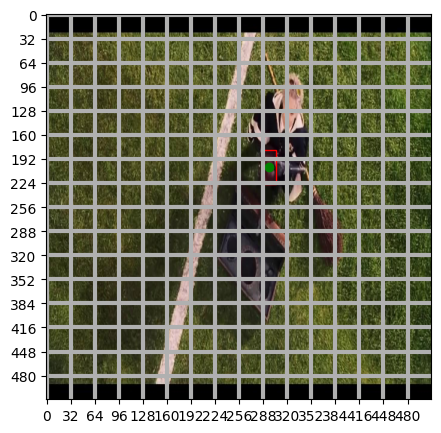

In [ ]:
# @title Текст заголовка по умолчанию
fig, ax = plt.subplots(figsize=(5, 5))
i = 42

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Реализуйте аналогичные принципы, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами.

То есть, нужно проделать операции из collate_fn в обратную сторону.

*А докстринг не писать это сейчас так модно делать или в чем проблема была пояснить, за что отвечает каждый аргумент в функции ниже??? :/*

In [ ]:
def decode_prediction(pred, upsample=32, threshold=0.7):
    b, c, h, w = pred.shape # почему тут идет перестановка, если в collate_fn её нет???
    img_w, img_h = w * upsample, h * upsample
    ### YOUR CODE HERE ###

    # Extract relevant predictions (similar to collate_fn)
    pred_boxes = pred[:, :4, :, :]
    pred_confidence = pred[:, 4, :, :]
    pred_classes = pred[:, 5:, :, :]

    # Generate grid cells
    grid_y, grid_x = torch.meshgrid([torch.arange(h), torch.arange(w)])
    grid_x = grid_x.unsqueeze(0).expand(b, -1, -1, -1).to(pred.device)
    grid_y = grid_y.unsqueeze(0).expand(b, -1, -1, -1).to(pred.device)

    # Decode bounding box coordinates
    pred_x, pred_y, pred_w, pred_h = torch.split(pred_boxes, 1, dim=1)
    # pred_x = (pred_x + grid_x) * upsample
    pred_x = grid_x * upsample + pred_x * img_w / 16
    pred_y = grid_y * upsample + pred_y * img_h / 16
    pred_w = pred_w * img_w
    pred_h = pred_h * img_h

    # Apply confidence threshold
    mask = pred_confidence > threshold

    # for index of images
    s = ''
    for i in range(b):
        s += str(i + 1) * mask[i, :, :].sum().item()

    idx = list(map(int, s))
    mask = mask.unsqueeze(1)
    pred_x = pred_x[mask]
    pred_y = pred_y[mask]
    pred_w = pred_w[mask]
    pred_h = pred_h[mask]

    pred_confidence = pred_confidence[mask.squeeze(1)]

    pred_classes = pred_classes.permute(0, 2, 3, 1).contiguous().view(-1, C)
    mask = mask.permute(0, 2, 3, 1).contiguous().view(-1)
    pred_classes = torch.argmax(pred_classes[mask, :], dim=1)

    # Combine into rectangles
    rectangles = torch.stack([
                                pred_x - pred_w / 2, # xmin
                                pred_y - pred_h / 2, # ymin
                                pred_x + pred_w / 2, # xmax
                                pred_y + pred_h / 2, # ymax
                                pred_classes
                            ], dim=-1)

    rects_n_imgs_id = defaultdict(list)
    for id, rect in zip(idx, rectangles):
        rects_n_imgs_id[int(id)].append(rect)

    return rects_n_imgs_id, pred_confidence, pred_classes

## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 вклюяительно) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), **мы после финальной свертки еще применим сигмоиду**. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [ ]:
C = 3 # Зачем считать, если это сказано в условии.. # Количество классов в вашем датасете, хоть руками посчитайте, хоть подтяните из словаря классов


class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        ### YOUR CODE HERE ###

        self.big_block = nn.Sequential(
            self.model.conv1,
            self.model.bn1,
            self.model.relu,
            self.model.maxpool,
            self.model.layer1,
            self.model.layer2,
            self.model.layer3,
            self.model.layer4,
        )

        self.big_conv_block = nn.Sequential()
        for i in range(8):
            in_c = 2048 // 2 ** i
            out_c = in_c // 2

            if out_c < 16:
                out_c = 5 + C

            self.big_conv_block.add_module(f'conv_block{i + 1}', nn.Conv2d(in_c, out_c, 3, padding=1))

            if i == 7:
                self.big_conv_block.add_module(f'sigmoid', nn.Sigmoid())
            else:
                self.big_conv_block.add_module(f'bn{i + 1}', nn.BatchNorm2d(out_c))
                self.big_conv_block.add_module(f'relu{i + 1}', nn.ReLU())


    def forward(self, img):
        ### YOUR CODE HERE ###
        img = self.big_conv_block(self.big_block(img))
        return img

## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)

* Ниже есть assert. Если вы экспериментируете с лоссом, он не будет проходить, не обращайте на него внимание. Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. assert написан для 3 классов, в задаче с картами их 6. Подумайте как зависит индексация от параметра C и используйте его.

In [ ]:
import torch.nn.functional as F

def special_loss(pred, target, check=False, C=3):
    '''
    pred: torch.Tensor: [batch_size, 5 + C, grid_size, grid_size]
    target: torch.Tensor: [batch_size, 6, grid_size, grid_size]
    '''

    # Our target tensor contains only the class of the detected object
    # but in order to culculate the cross-entropy loss we need the probability distribution under classes

    new_size = 5 + C
    sizes = list(target.size())
    sizes[1] = new_size

    classes = target[:, -1, :, :] # got classes for each detected object
    new_target = torch.zeros(tuple(sizes))

    for i in range(6):
        if i == 5:
            # Obtain the last element of the first axis of the original target tensor
            # and transform it into [1, 0, 0], [0, 1, 0] or [0, 0, 1]
            new_target[:, i:, :, :] = torch.eye(3)[classes.to('cpu').squeeze().long()].permute(0, 3, 1, 2).to('cpu')
        else:
            # Copy the values from the original target tensor to the new one
            new_target[:, i, :, :] = target[:, i, :, :]

    target = new_target
    pred = pred.to(device)

    # Extract relevant predictions
    pred_boxes = pred[:, :4, :, :]
    pred_confidence = pred[:, 4, :, :] # binary var responses for object presence in particular cell
    pred_classes = pred[:, 5:, :, :] # probs for each class

    # Extract target values
    target_boxes = target[:, :4, :, :]
    target_confidence = target[:, 4, :, :]
    target_classes = target[:, 5:, :, :]

    # Create masks for object presence and absence
    obj_mask = target_confidence > 0  # Mask for cells with a detected object
    noobj_mask = target_confidence == 0  # Mask for cells without a detected object

    obj_mask = obj_mask.unsqueeze(-1).permute(0, 3, 1, 2).expand(-1, 4, -1, -1)
    obj_mask = obj_mask.to(device)

    noobj_mask = noobj_mask.unsqueeze(-1).permute(0, 3, 1, 2).expand(-1, 4, -1, -1)
    no_obj_mask = noobj_mask.to(device)

    # Localization loss - MSE for box coordinates where an object is present
    localization_loss = F.mse_loss(
                                    torch.masked_select(pred_boxes[:, :2, :, :], obj_mask[:, :2, :, :]),
                                    torch.masked_select(target_boxes.to(device)[:, :2, :, :], obj_mask.to(device)[:, :2, :, :]),
                                    reduction='sum'
                                   )


    # Box loss - MSE for square root of width and height
    box_loss = F.mse_loss(
                            torch.sqrt(torch.masked_select(pred_boxes.to(device)[:, 2:4, :, :], obj_mask.to(device)[:, 2:4, :, :])),
                            torch.sqrt(torch.masked_select(target_boxes.to(device)[:, 2:4, :, :], obj_mask.to(device)[:, 2:4, :, :])),
                            reduction='sum'
                        )


    # Classification loss - Cross-entropy for object classes
    # Reshape tensors to the classical format when culculating the cross-entropy: [-1, C]
    obj_mask_2 = obj_mask[:, :3, :, :].permute(0, 2, 3, 1).contiguous().view(-1, C)[:, 0] # just get mask in suitable format
    obj_mask_2 = obj_mask_2.to(device)

    classification_loss = F.cross_entropy(
                                            pred_classes.to(device).permute(0, 2, 3, 1).contiguous().view(-1, C)[obj_mask_2, :],
                                            target_classes.to(device).permute(0, 2, 3, 1).contiguous().view(-1, C)[obj_mask_2, :],
                                            reduction='sum'
                                        )

    # Confidence loss - Binary cross-entropy for object presence/absence
    confidence_loss_obj = F.binary_cross_entropy(
                                                    torch.masked_select(pred_confidence.to(device), obj_mask[:, 0, :, :]),
                                                    torch.masked_select(target_confidence.to(device), obj_mask[:, 0, :, :]),
                                                    reduction='sum'
                                                )

    confidence_loss_noobj = F.binary_cross_entropy(
                                                    torch.masked_select(pred_confidence.to(device), noobj_mask.to(device)[:, 0, :, :]),
                                                    torch.masked_select(target_confidence.to(device), noobj_mask.to(device)[:, 0, :, :]),
                                                    reduction='sum'
                                                )

    # Weighted sum of confidence losses
    confidence_loss = confidence_loss_obj + 0.1 * confidence_loss_noobj

    if not check:
        # Total loss
        return localization_loss + box_loss + classification_loss + confidence_loss
    else:
        # Return individual losses for checking
        return localization_loss, box_loss, classification_loss, confidence_loss


In [ ]:
special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3)

# some problems with the classification loss

(tensor(5120., device='cuda:0'),
 tensor(5120., device='cuda:0'),
 tensor(2812.4475, device='cuda:0'),
 tensor(256000., device='cuda:0'))

In [ ]:
# localization box classification confidence - возвращаются в таком порядке, можно сравнить
# почему-то есть различие в кросс-энтропийным лоссе, причем в 3 знаке после запятой..
# assert special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3) == (torch.tensor(5120.), torch.tensor(5120.), torch.tensor(2812.4465), torch.tensor(256000.))

# почему ниже тогда размерность таргета в канале 6, а не 8 ..

# Задача 4. 2 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [ ]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)

In [ ]:
import gc
gc.collect()

12706

### Make it functional

In [ ]:
# @title define a save function
import torch
from pathlib import Path

def save_model(model: torch.nn.Module,
               target_dir: str,
               model_name: str):
    """Saves a PyTorch model to a target directory.

    Args:
    model: A target PyTorch model to save.
    target_dir: A directory for saving the model to.
    model_name: A filename for the saved model. Should include
      either ".pth" or ".pt" as the file extension.

    Example usage:
    save_model(model=model_0,
               target_dir="models",
               model_name="05_going_modular_tingvgg_model.pth")
    """
    # Create target directory
    target_dir_path = Path(target_dir)
    target_dir_path.mkdir(parents=True,
                        exist_ok=True)

    # Create model save path
    assert model_name.endswith(".pth") or model_name.endswith(".pt"), "model_name should end with '.pt' or '.pth'"
    model_save_path = target_dir_path / model_name

    # Save the model state_dict()
    print(f"[INFO] Saving model to: {model_save_path}")
    torch.save(obj=model.state_dict(),
             f=model_save_path)

In [ ]:
# @title define a writer function for tensorboard
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None) -> torch.utils.tensorboard.writer.SummaryWriter():
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

In [ ]:
# @title define train and test step funcs
import torch

from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
    model: A PyTorch model to be trained.
    dataloader: A DataLoader instance for the model to be trained on.
    loss_fn: A PyTorch loss function to minimize.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of training loss and training accuracy metrics.
    In the form (train_loss, train_accuracy). For example:

    (0.1112, 0.8743)
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss = 0

    # Loop through data loader data batches
    for batch, X_and_y in tqdm(enumerate(dataloader), total=len(dataloader), desc='Training', leave=False):
        # Send data to target device
        X, y = X_and_y['image'].to(device), X_and_y['target'].to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)

    return train_loss


def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
    model: A PyTorch model to be tested.
    dataloader: A DataLoader instance for the model to be tested on.
    loss_fn: A PyTorch loss function to calculate loss on the test data.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of testing loss and testing accuracy metrics.
    In the form (test_loss, test_accuracy). For example:

    (0.0223, 0.8985)
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss = 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, X_and_y in tqdm(enumerate(dataloader), total=len(dataloader), desc='Testing', leave=False):
            # Send data to target device
            X, y = X_and_y['image'].to(device), X_and_y['target'].to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)

    return test_loss

In [ ]:
# @title define a train function
from typing import Dict, List
from tqdm.auto import tqdm

# Add writer parameter to train()
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]}
      For example if training for epochs=2:
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "test_loss": [],
    }

    best_test_loss = float('inf')

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)

        test_loss = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"test_loss: {test_loss:.4f} | "
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["test_loss"].append(test_loss)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass


        if  test_loss < best_test_loss:
            best_test_loss = test_loss

            save_filepath = f"best_model_{epochs}_epochs_with_{best_test_loss}_loss.pth"
            save_model(model=model,
                       target_dir="/content/drive/MyDrive/best_models",
                       model_name=save_filepath)


    ### End new ###

    # Return the filled results at the end of the epochs
    return results

как посоветовали в чате, поставим 20 эпох

In [ ]:
# 1. Create epochs list
num_epochs = [40]

# 2. Create models list (need to create a new model for each experiment)
models = ["my_net"]

# 3. Create dataloaders dictionary for various dataloaders
train_dataloaders = {"data_any_percent": loader}

In [ ]:
# @title code
# %%time
# 1. Set the random seeds
seed_everything(42)

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs:

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")

            # 7. Select the model
            if model_name == "my_net":
                model = Detector().to(device)

            # 8. Create a new loss and optimizer for every model
            loss_fn = lambda pred, batch: special_loss(pred, batch.to(device))

            optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

            # 9. Train target model with target dataloaders and track experiments
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_loader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))

            # 10. Save the model to file so we can get back the best model
            save_filepath = f"{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: my_net
[INFO] DataLoader: data_any_percent
[INFO] Number of epochs: 40
[INFO] Created SummaryWriter, saving to: runs/2023-12-06/data_any_percent/my_net/40_epochs...


  0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 6947.1920 | test_loss: 3522.6450 | 
[INFO] Saving model to: /content/drive/MyDrive/best_models/best_model_40_epochs_with_3522.644970703125_loss.pth


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 2 | train_loss: 6933.1603 | test_loss: 3518.6468 | 
[INFO] Saving model to: /content/drive/MyDrive/best_models/best_model_40_epochs_with_3518.646826171875_loss.pth


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 3 | train_loss: 6928.2240 | test_loss: 3514.5537 | 
[INFO] Saving model to: /content/drive/MyDrive/best_models/best_model_40_epochs_with_3514.5537109375_loss.pth


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 4 | train_loss: 6921.9325 | test_loss: 3510.4187 | 
[INFO] Saving model to: /content/drive/MyDrive/best_models/best_model_40_epochs_with_3510.418701171875_loss.pth


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 5 | train_loss: 6919.9139 | test_loss: 3517.2216 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 6 | train_loss: 6918.9619 | test_loss: 3529.3281 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 7 | train_loss: 6919.1745 | test_loss: 3519.2689 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 8 | train_loss: 6919.4771 | test_loss: 3517.0080 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 9 | train_loss: 6921.5141 | test_loss: 3513.8876 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 10 | train_loss: 6918.6645 | test_loss: 3516.2654 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 11 | train_loss: 6916.4206 | test_loss: 3517.6087 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 12 | train_loss: 6916.1029 | test_loss: 3517.1708 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 13 | train_loss: 6917.9454 | test_loss: 3517.0424 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 14 | train_loss: 6916.2518 | test_loss: 3521.1629 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 15 | train_loss: 6915.0129 | test_loss: 3517.2051 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 16 | train_loss: 6915.3146 | test_loss: 3518.3549 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 17 | train_loss: 6914.9859 | test_loss: 3518.4095 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 18 | train_loss: 6915.1580 | test_loss: 3517.5651 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 19 | train_loss: 6916.9990 | test_loss: 3531.9209 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 20 | train_loss: 6918.3625 | test_loss: 3522.1400 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 21 | train_loss: 6917.4912 | test_loss: 3523.0465 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 22 | train_loss: 6917.4990 | test_loss: 3515.4025 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 23 | train_loss: 6916.9104 | test_loss: 3518.3743 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 24 | train_loss: 6915.6116 | test_loss: 3515.8795 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 25 | train_loss: 6914.7607 | test_loss: 3524.0354 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 26 | train_loss: 6914.3323 | test_loss: 3530.0335 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 27 | train_loss: 6914.6120 | test_loss: 3519.0725 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 28 | train_loss: 6914.4315 | test_loss: 3518.7791 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 29 | train_loss: 6914.1950 | test_loss: 3515.9178 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 30 | train_loss: 6914.4445 | test_loss: 3524.2531 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 31 | train_loss: 6915.0361 | test_loss: 3529.4553 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 32 | train_loss: 6915.7545 | test_loss: 3516.0395 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 33 | train_loss: 6915.5002 | test_loss: 3522.9021 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 34 | train_loss: 6917.0481 | test_loss: 3531.5416 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 35 | train_loss: 6916.2128 | test_loss: 3521.8699 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 36 | train_loss: 6916.7127 | test_loss: 3517.8195 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 37 | train_loss: 6915.7084 | test_loss: 3522.1149 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 38 | train_loss: 6915.7476 | test_loss: 3516.4164 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 39 | train_loss: 6914.4288 | test_loss: 3521.5375 | 


Training:   0%|          | 0/26 [00:00<?, ?it/s]

Testing:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 40 | train_loss: 6913.9865 | test_loss: 3523.8893 | 
[INFO] Saving model to: models/my_net_data_any_percent_40_epochs.pth
--------------------------------------------------



In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

видно, что есть небольшое переобучение

Запустим обученный детектор на тестовых изображениях:

In [ ]:
model = Detector().to(device)
# model.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/iad/dl_iad/YOLO_results/my_net_data_any_percent_20_epochs.pth", map_location=torch.device('cpu')))
model.load_state_dict(torch.load('/content/drive/MyDrive/best_models/best_model_40_epochs_with_3510.418701171875_loss.pth'))

<All keys matched successfully>

In [ ]:
# Нужно сделать предсказание и переложить результат на cpu

### YOUR CODE HERE ###

In [ ]:
# Сделайте визуализацию. Поиграйтесь с threshold, скорее всего нужно понизить до ~0.1

### YOUR CODE HERE ###

In [ ]:
test_batch = next(iter(test_loader))
test_pred = model(test_batch['image'].to(device))

In [ ]:
rects_n_imgs_id, pred_confidence, pred_classes = decode_prediction(test_pred, upsample=32, threshold=0.5)

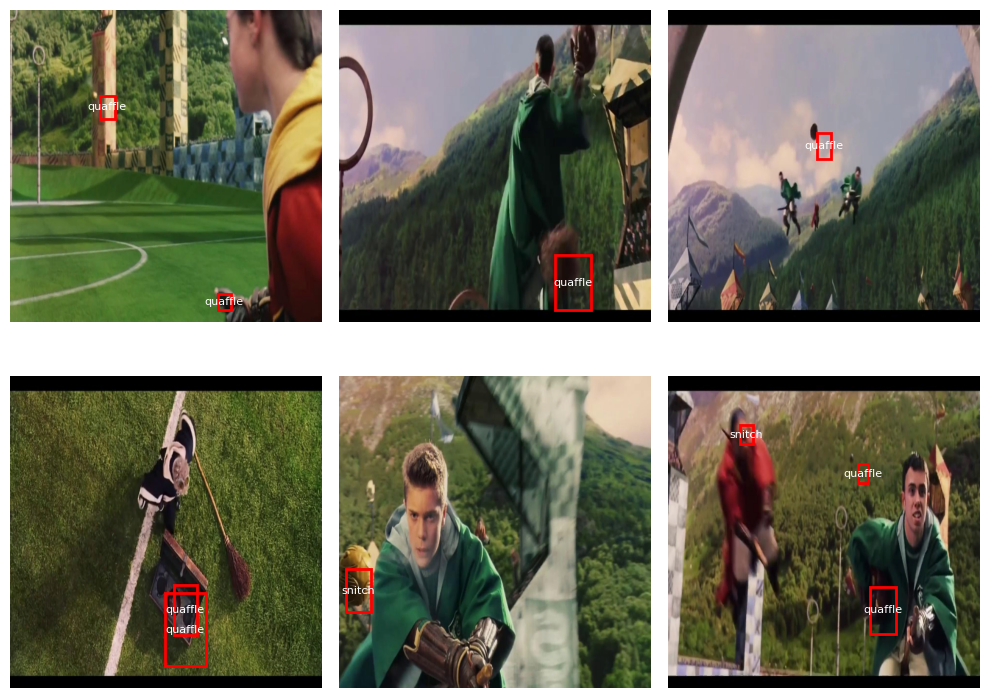

In [ ]:
visualize(test_batch['image'], rects_n_imgs_id)

In [ ]:
batch = next(iter(loader))
pred = model(batch['image'].to(device))

In [ ]:
rects_n_imgs_id, pred_confidence, pred_classes = decode_prediction(pred, upsample=32, threshold=0.5)

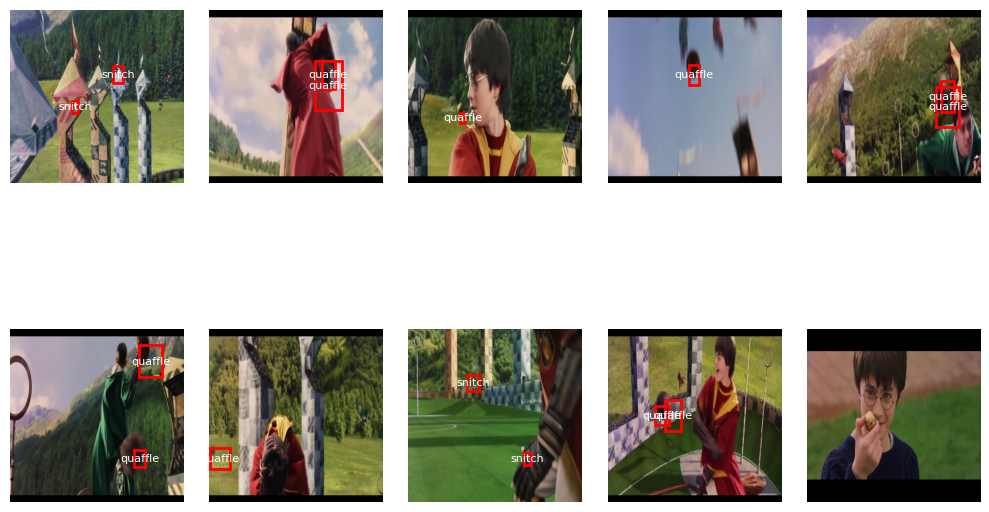

In [ ]:
visualize(batch['image'], rects_n_imgs_id)

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO v8 от ultralytics.

In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 646.6/646.6 kB 8.1 MB/s eta 0:00:00


## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt) (example: [тут](https://roboflow.com/formats/yolov8-pytorch-txt)_ )

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [ ]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO v8. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

In [ ]:
def annotation2txt(bboxes: list[dict], w_im: int, h_im: int) -> list[str]:
    ### YOUR CODE HERE ###

    lines = []

    for bbox in bboxes:
        class_id = bbox['class']
        x_min, y_min, x_max, y_max = bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']

        center_x = (x_min + x_max) / (2.0 * w_im)
        center_y = (y_min + y_max) / (2.0 * h_im)
        width = (x_max - x_min) / w_im
        height = (y_max - y_min) / h_im

        line = f"{class_id} {center_x} {center_y} {width} {height}"
        lines.append(line)

    return lines


In [ ]:
# Копируем картиночки по папочкам и создаем txt файлики

for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
                "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
                "w",
                encoding="utf8",
            ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0], "./valid/images/" + result[0].split("/")[-1],
    )

    with open(
            "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
            "w",
            encoding="utf8",
        ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [ ]:
# Собираем YAML

nc: int =  3 # Укажите число классов. Хоть руками, хоть по-умному посчитайте (см. class_dict)
names: list[str] =  ['buldger', 'quaffle', 'snitch'] # Укажите имена классов. Хоть руками, хоть по-умному посчитайте, это массив строк (см. class_dict)

with open("data.yaml", "w") as f:
    f.write(f"train: ../train/images\nval: ../valid/images\n\nnc: {nc}\nnames: {names}")

## Задание 5.2. 1.5 балла.

Обучите модель YOLO v8 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель нужно взять необученную!

Подсказка: подумайте зачем вам data.yaml и что такое yolov8n.yaml (не стесняйтесь гуглить)

In [ ]:
from ultralytics import YOLO
# for more: https://docs.ultralytics.com/ru/modes/

model = YOLO('yolov8n.yaml')
result = model.train(data='data.yaml', epochs=100)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 755k/755k [00:00<00:00, 42.4MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

YOLOv8n summary: 225 layers, 3011433 parameters, 3011417 gradients, 8.2 GFLOPs

TensorBoard: Start with 'tensorboard --logdir runs/detect/train', view at http://localhost:6006/
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 116MB/s]


AMP: checks passed ✅


train: Scanning /content/train/labels... 254 images, 0 backgrounds, 0 corrupt: 100%|██████████| 254/254 [00:00<00:00, 2222.15it/s]

train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/valid/labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 1346.19it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.69G      4.622      8.997      4.274         28        640: 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

                   all         29         33   0.000277     0.0278    0.00015   6.02e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.55G       4.49      8.147      4.194         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         29         33   0.000255     0.0278    0.00017   6.78e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.55G      4.405      7.965      4.021         23        640: 100%|██████████| 16/16 [00:05<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         29         33   0.000254     0.0278   0.000275   0.000105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.55G      3.999      6.846      3.712         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         29         33   0.000267     0.0278   0.000243   9.73e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.55G       3.67      6.113       3.31         37        640: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         29         33   0.000132     0.0278   0.000541    0.00024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.55G      3.398      5.936      2.984         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         29         33   0.000104     0.0238   6.76e-05   1.35e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.55G       3.12      5.872      2.828         22        640: 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all         29         33   0.000261     0.0278   0.000221    0.00011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.55G      2.999      5.223      2.667         34        640: 100%|██████████| 16/16 [00:05<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         29         33   0.000155     0.0278   0.000102   5.08e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.56G      2.898      4.883      2.486         29        640: 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         29         33   0.000565      0.103   0.000453   0.000153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.55G       2.75       4.78      2.518         29        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         29         33   0.000348     0.0794   0.000262   8.83e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.55G      2.679      4.383       2.34         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         29         33   0.000685      0.127    0.00105   0.000312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.55G      2.587      4.185      2.207         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         29         33    0.00105      0.171    0.00704    0.00159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.55G      2.602      3.976      2.213         33        640: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         29         33   0.000887      0.123     0.0151    0.00326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.55G      2.528      3.882      2.208         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         33     0.0133      0.198      0.038     0.0194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.55G      2.364      3.673      2.052         30        640: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         29         33       0.13     0.0476     0.0426     0.0209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.55G      2.284      3.542      1.985         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         29         33     0.0649     0.0238     0.0351     0.0228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.55G      2.305      3.162      1.962         35        640: 100%|██████████| 16/16 [00:05<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         29         33      0.246     0.0238     0.0305      0.019



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.55G      2.212      3.225      1.935         44        640: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         29         33      0.152     0.0476     0.0433     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.55G       2.23      3.032      1.939         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         29         33      0.196     0.0476     0.0473      0.036



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.55G      2.152      3.039      1.823         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         33      0.104     0.0714     0.0531     0.0318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.55G      2.126      2.944      1.799         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         29         33      0.184     0.0476     0.0556     0.0328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.55G      2.022      2.593      1.769         30        640: 100%|██████████| 16/16 [00:05<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

                   all         29         33      0.132     0.0476     0.0525     0.0344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.55G      2.087      2.635      1.824         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         33      0.194     0.0714     0.0858     0.0306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.55G      1.987      2.463      1.732         27        640: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         33      0.279     0.0714     0.0882      0.039



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.55G      2.014      2.409      1.714         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         29         33     0.0773     0.0952     0.0863     0.0547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.55G       1.99      2.403       1.67         28        640: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         29         33      0.233     0.0952      0.108     0.0455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.55G      1.984      2.408      1.656         24        640: 100%|██████████| 16/16 [00:05<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

                   all         29         33      0.639     0.0476     0.0789     0.0554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.55G      1.847      2.291      1.611         30        640: 100%|██████████| 16/16 [00:06<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         29         33      0.496      0.167       0.12     0.0554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.55G      1.963      2.365       1.71         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         29         33      0.187      0.119       0.12     0.0504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.55G      1.971      2.224      1.645         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         29         33       0.13     0.0952     0.0932     0.0488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.55G      1.843       2.15      1.546         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         33      0.256      0.143      0.157       0.07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.55G      1.883      2.131      1.604         41        640: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         29         33      0.264     0.0952      0.133     0.0679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.55G       1.74      2.006       1.53         25        640: 100%|██████████| 16/16 [00:05<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         29         33      0.133      0.119      0.114     0.0666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.55G      1.871      2.144      1.598         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         29         33      0.192      0.167      0.147     0.0669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.55G      1.808      2.023      1.564         29        640: 100%|██████████| 16/16 [00:06<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         29         33      0.325      0.143      0.176     0.0796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.55G      1.786      1.989      1.588         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         29         33      0.159      0.167      0.126       0.07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.55G      1.806      1.922       1.55         23        640: 100%|██████████| 16/16 [00:05<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         29         33      0.253      0.119      0.164     0.0906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.55G      1.793      1.904      1.513         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         29         33       0.17      0.167      0.157     0.0971



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.55G      1.748      1.886      1.477         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         29         33      0.291      0.162      0.191     0.0882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.55G      1.708      1.766      1.472         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         29         33       0.26       0.19      0.185     0.0885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.55G      1.641      1.731      1.453         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         29         33      0.177      0.143      0.143     0.0735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.55G      1.738      1.799      1.521         29        640: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all         29         33      0.209      0.171      0.164     0.0778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.55G      1.615      1.657       1.42         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         29         33      0.222      0.142      0.165     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.55G       1.61      1.738      1.459         29        640: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         29         33       0.18       0.19      0.188        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.55G       1.65      1.758      1.461         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         29         33      0.171      0.171      0.169     0.0943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.55G      1.676      1.711      1.452         27        640: 100%|██████████| 16/16 [00:05<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         29         33      0.207      0.171      0.153     0.0819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.55G       1.61      1.556        1.4         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all         29         33       0.19      0.218      0.181     0.0945



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.55G      1.537      1.537      1.345         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         29         33      0.181      0.143      0.175      0.088



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.55G      1.576      1.573      1.405         20        640: 100%|██████████| 16/16 [00:05<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         29         33      0.229      0.194       0.21      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.55G      1.558      1.549      1.336         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         29         33      0.219      0.242      0.204      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.55G      1.524      1.558      1.387         33        640: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         29         33      0.253      0.167      0.212      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.56G      1.511      1.447      1.366         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all         29         33      0.228      0.167      0.189      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.55G      1.543       1.56      1.421         26        640: 100%|██████████| 16/16 [00:05<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         29         33      0.235      0.205      0.192     0.0996



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.55G      1.553      1.432      1.356         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         33      0.189      0.215      0.192     0.0967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.55G      1.598      1.504      1.333         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         29         33      0.227      0.218      0.204      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.56G      1.497      1.417      1.313         31        640: 100%|██████████| 16/16 [00:05<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         29         33      0.207      0.167      0.171     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.55G      1.455      1.384       1.27         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         29         33       0.18      0.251      0.184      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.55G      1.506      1.403      1.304         34        640: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         29         33      0.191      0.262      0.175      0.095



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.55G       1.43      1.317      1.276         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         29         33      0.212      0.266      0.195     0.0906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.55G      1.565      1.414      1.342         20        640: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         29         33      0.165      0.214      0.167     0.0834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.55G      1.425      1.323      1.279         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         33      0.205      0.194      0.187      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.55G      1.495      1.374      1.298         27        640: 100%|██████████| 16/16 [00:05<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         29         33      0.245      0.242      0.198     0.0993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.55G      1.531      1.368      1.346         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         29         33      0.316      0.171      0.169     0.0844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.55G      1.459      1.336        1.3         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all         29         33      0.229      0.242      0.184     0.0995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.55G      1.478      1.333      1.328         38        640: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         29         33      0.217      0.228      0.198       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.55G        1.4       1.27      1.292         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         33      0.259      0.242       0.21      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.55G       1.47      1.305      1.335         26        640: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         29         33      0.216      0.242      0.191      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.55G      1.434      1.259      1.304         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         29         33       0.24      0.242      0.195     0.0974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.55G      1.402       1.23      1.256         28        640: 100%|██████████| 16/16 [00:05<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         29         33      0.219      0.228      0.208      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.55G      1.401      1.247      1.244         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         29         33      0.251      0.242      0.211      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.55G      1.384      1.195      1.246         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         29         33      0.257      0.242      0.215      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.55G       1.32      1.129      1.239         27        640: 100%|██████████| 16/16 [00:05<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all         29         33      0.302      0.213      0.206      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.55G      1.375      1.206      1.257         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         29         33      0.248      0.242      0.194     0.0972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.55G      1.405      1.282      1.295         22        640: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         33      0.267      0.242      0.208      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.55G      1.389      1.229      1.289         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         29         33      0.258      0.218       0.19      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.55G      1.344      1.156      1.259         30        640: 100%|██████████| 16/16 [00:05<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         29         33      0.272      0.242      0.216       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.55G      1.336      1.131      1.268         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         29         33      0.277      0.242      0.238      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.55G      1.335      1.097      1.233         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         29         33      0.253      0.266      0.247      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.55G       1.29      1.073       1.24         34        640: 100%|██████████| 16/16 [00:05<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         33      0.324      0.218       0.22      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.55G      1.314      1.064      1.208         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         29         33      0.227      0.242      0.212      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.55G       1.34      1.108      1.246         29        640: 100%|██████████| 16/16 [00:06<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         29         33      0.252      0.242      0.202      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.55G      1.337      1.124      1.253         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         29         33      0.306      0.215      0.203      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.55G      1.279        1.1      1.163         24        640: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         29         33      0.276      0.266      0.209      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.56G      1.252      1.018      1.206         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         29         33      0.278      0.257      0.218      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.55G      1.308      1.078      1.209         19        640: 100%|██████████| 16/16 [00:05<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

                   all         29         33      0.258      0.242      0.217      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.55G      1.295      1.092      1.172         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all         29         33      0.276      0.242      0.216      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.55G      1.263       1.03        1.2         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         29         33      0.312      0.242      0.228      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.55G      1.289      1.072      1.221         22        640: 100%|██████████| 16/16 [00:05<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         29         33       0.31      0.238      0.216      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.55G      1.264      1.017      1.197         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         29         33       0.31      0.239      0.227      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.55G      1.254      1.028      1.186         25        640: 100%|██████████| 16/16 [00:06<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         29         33      0.322      0.218      0.224      0.115


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.69G      1.267      1.213      1.221         17        640: 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         29         33      0.264      0.266      0.225      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.55G      1.256      1.087      1.187         16        640: 100%|██████████| 16/16 [00:05<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         29         33      0.342      0.218      0.211      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.55G      1.265      1.092      1.206         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         33      0.343      0.218      0.207      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.55G      1.247      1.033      1.209         15        640: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         29         33      0.298      0.218      0.206      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.55G      1.248      1.056      1.207         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         29         33      0.262      0.242      0.219      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.55G      1.177      1.017      1.177         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         29         33      0.309      0.217      0.212      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.55G      1.215      1.029      1.163         15        640: 100%|██████████| 16/16 [00:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         29         33      0.274      0.265      0.218      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.55G      1.226      1.059      1.206         15        640: 100%|██████████| 16/16 [00:04<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         29         33      0.262      0.266       0.22      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.55G      1.167      0.961      1.152         15        640: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         29         33      0.269      0.266      0.217      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.55G      1.127     0.9067      1.154         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         29         33      0.267      0.266      0.217      0.113



100 epochs completed in 0.191 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]


                   all         29         33      0.277      0.242      0.238      0.123
               buldger         29         14      0.736      0.643      0.627      0.335
               quaffle         29         12     0.0944     0.0833     0.0874      0.035
                snitch         29          7          0          0          0          0
Speed: 0.2ms preprocess, 1.4ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


AttributeError: ignored

лоссы уменьшаются, все круто

P.S. не знал, что нельзя сохранить такую модель через `.save`, поэтому в конце возникла ошибка

в выводе выше, кстати есть сразу же метрики и на валидации

так как сама библиотека сделала за меня всю работу, то остается только отрисовать полученные результаты. Качество шакальное, ссылка на папки, где можно пдробнее рассмотреть каждую картинку приведу ниже.

In [ ]:
def plot_imgs(image_files: list[str], rows: int = 2, cols: int = 2):
    fig, axs = plt.subplots(rows, cols, figsize=(10, 8))

    axs = axs.flatten()
    for i, img_file in enumerate(image_files):
        img = cv2.imread(img_file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[i].imshow(img)
        axs[i].axis('off')  # Turn off axis labels
        # axs[i].set_title(f'Image {i+1}')

    plt.tight_layout()
    plt.show()

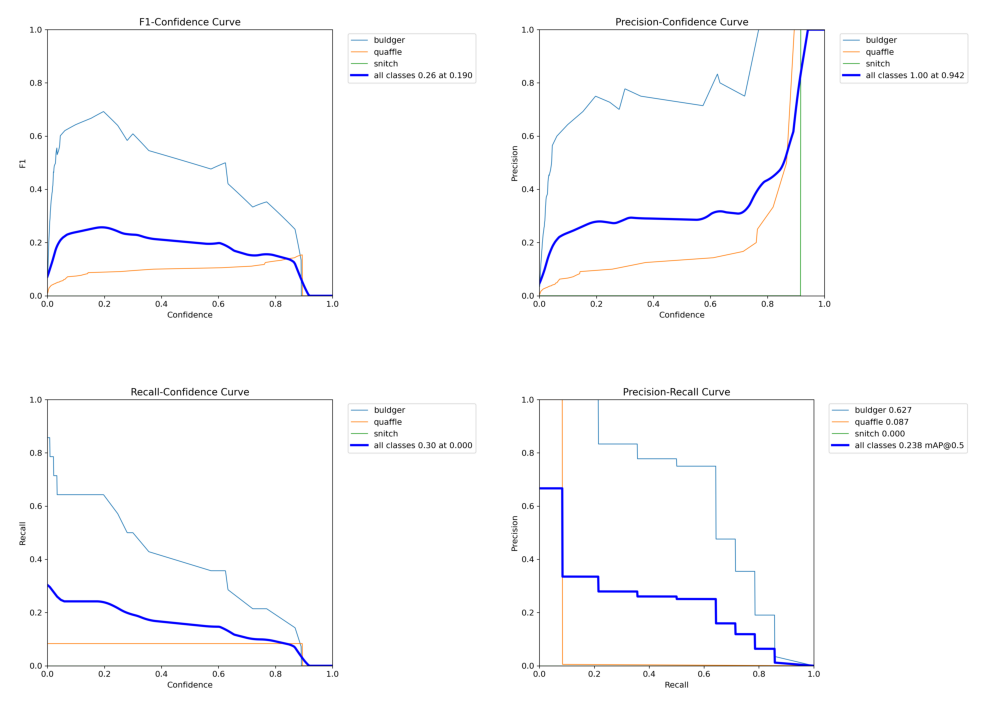

In [ ]:
image_files = ['/content/runs/detect/train/F1_curve.png',
               '/content/runs/detect/train/P_curve.png',
               '/content/runs/detect/train/R_curve.png',
               '/content/runs/detect/train/PR_curve.png'
            ]

plot_imgs(image_files)

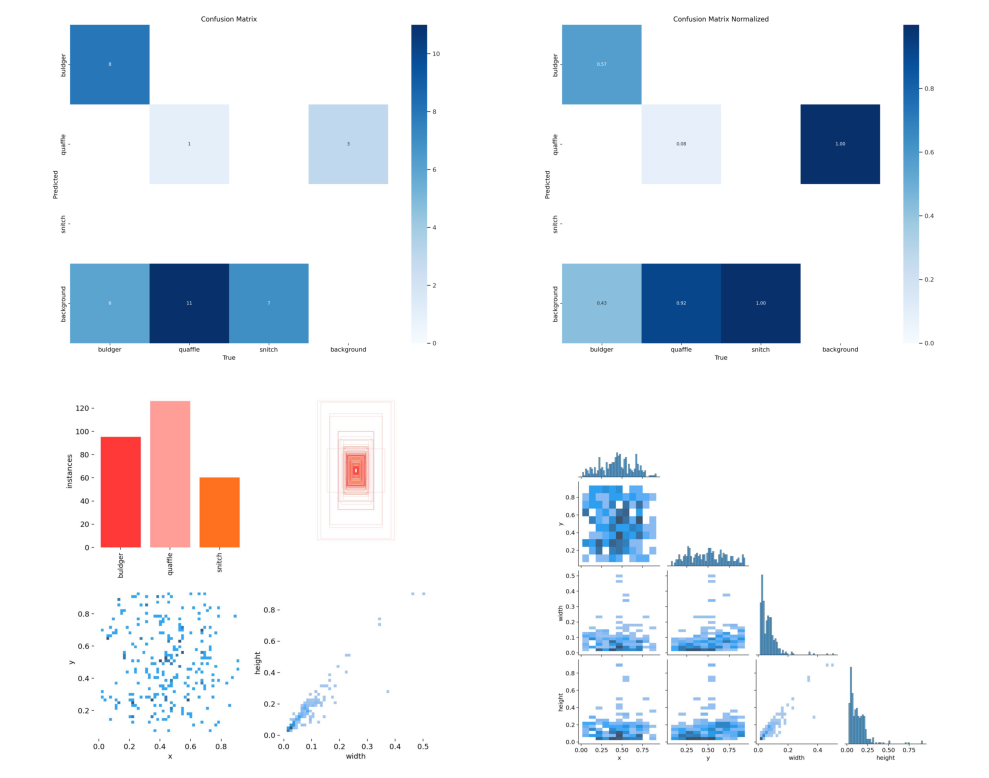

In [ ]:
image_files = ['/content/runs/detect/train/confusion_matrix.png',
               '/content/runs/detect/train/confusion_matrix_normalized.png',
               '/content/runs/detect/train/labels.jpg',
               '/content/runs/detect/train/labels_correlogram.jpg'
               ]

plot_imgs(image_files)

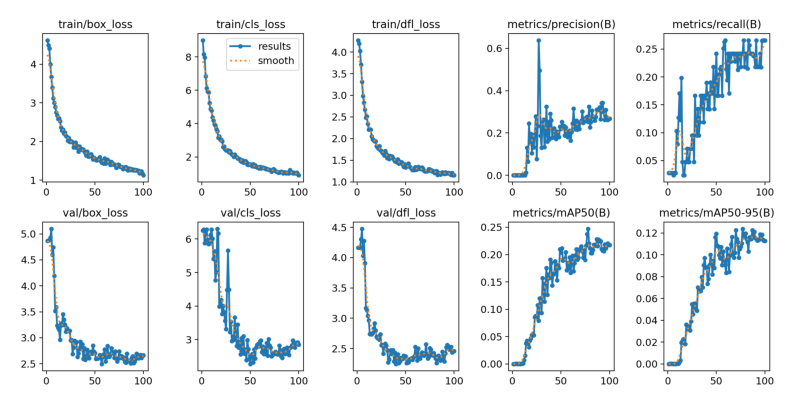

In [ ]:
plt.figure(figsize=(10, 10))

img = cv2.imread('/content/runs/detect/train/results.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(img);

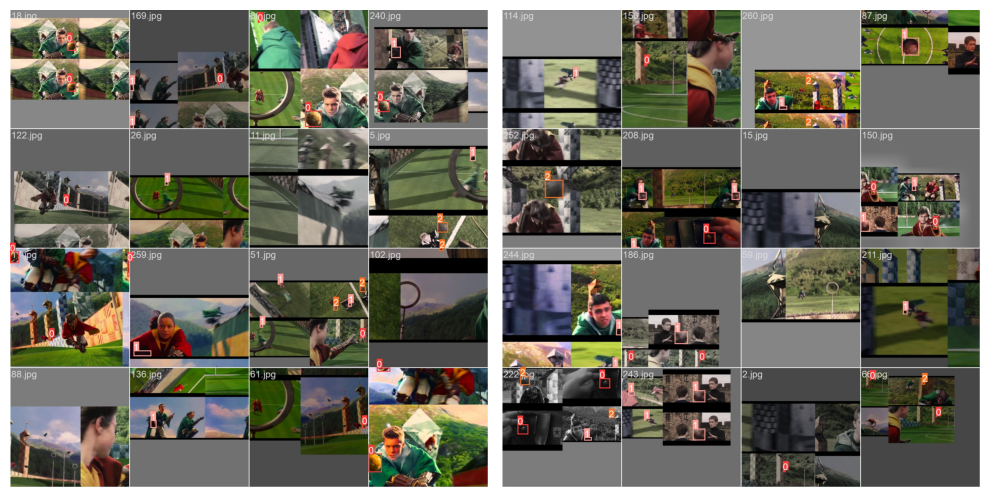

In [ ]:
image_files = ['/content/runs/detect/train/train_batch0.jpg',
               '/content/runs/detect/train/train_batch1.jpg',
            ]

plot_imgs(image_files, rows=1, cols=2)

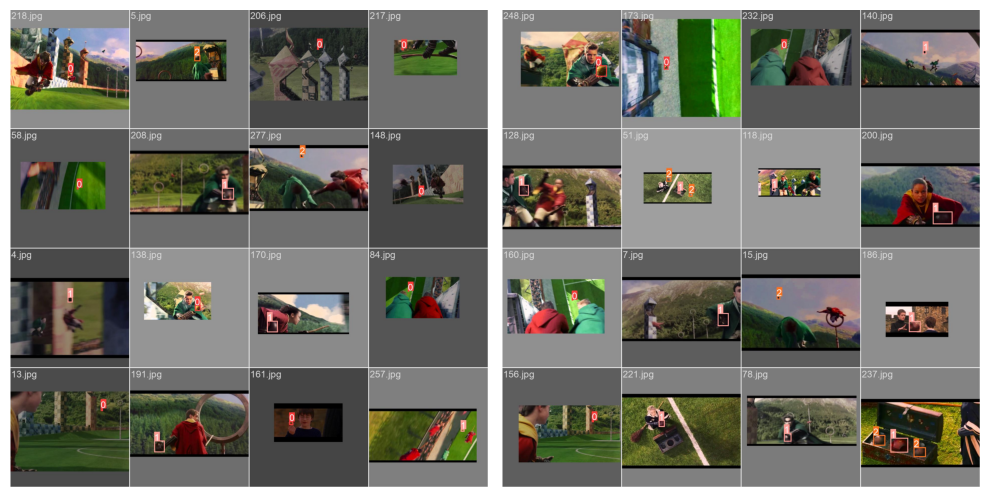

In [ ]:
image_files = ['/content/runs/detect/train/train_batch1440.jpg',
               '/content/runs/detect/train/train_batch1441.jpg'
            ]

plot_imgs(image_files, rows=1, cols=2)

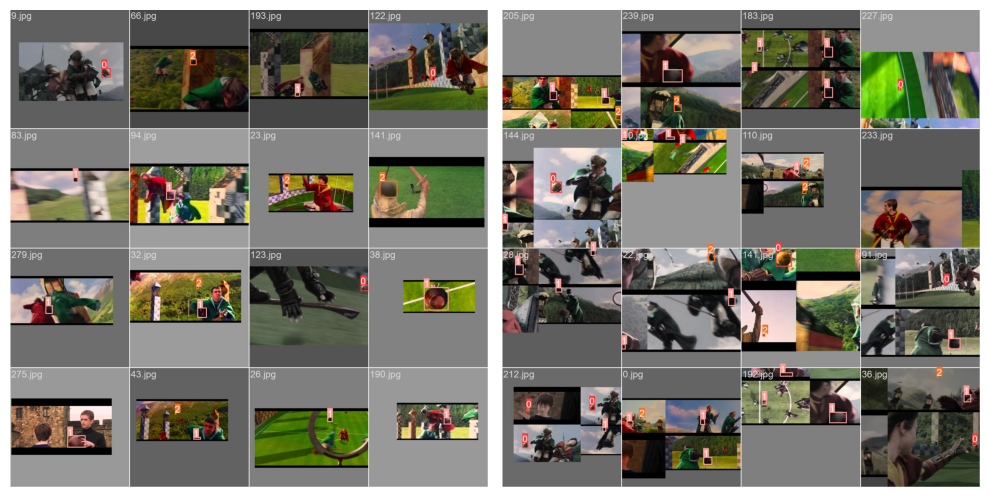

In [ ]:
image_files = ['/content/runs/detect/train/train_batch1442.jpg',
               '/content/runs/detect/train/train_batch2.jpg'
            ]

plot_imgs(image_files, rows=1, cols=2)

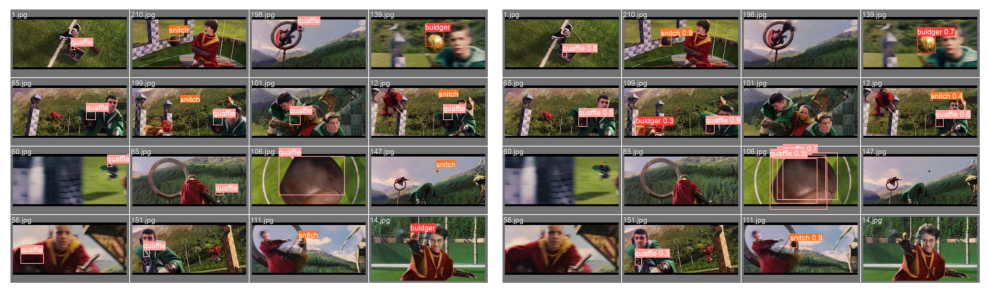

In [ ]:
image_files = ['/content/runs/detect/train/val_batch0_labels.jpg',
               '/content/runs/detect/train/val_batch0_pred.jpg'
            ]

plot_imgs(image_files, rows=1, cols=2)

даже на 100 эпохах результат не очень хороший.

## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет. (Видимо кто-то давно не работал в колабе)

In [ ]:
### YOUR CODE HERE ###

model = YOLO('/content/runs/detect/train/weights/best.pt')  # загрузить пользовательскую модель

# Проверка модели
metrics = model.val()  # аргументы не нужны, набор данных и настройки запомнены

Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/valid/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]


                   all         29         33      0.258      0.242      0.233       0.12
               buldger         29         14      0.681      0.643      0.612      0.325
               quaffle         29         12     0.0935     0.0833     0.0874      0.035
                snitch         29          7          0          0          0          0
Speed: 0.3ms preprocess, 19.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


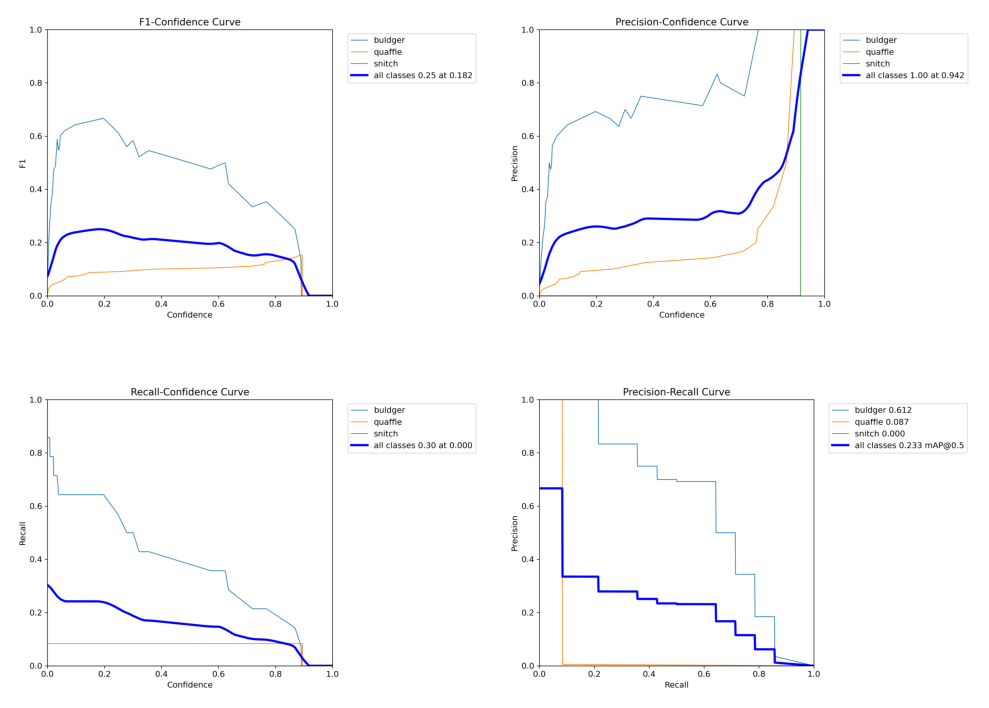

In [ ]:
image_files = ['/content/runs/detect/val/F1_curve.png',
               '/content/runs/detect/val/P_curve.png',
               '/content/runs/detect/val/R_curve.png',
               '/content/runs/detect/val/PR_curve.png'
            ]

plot_imgs(image_files)

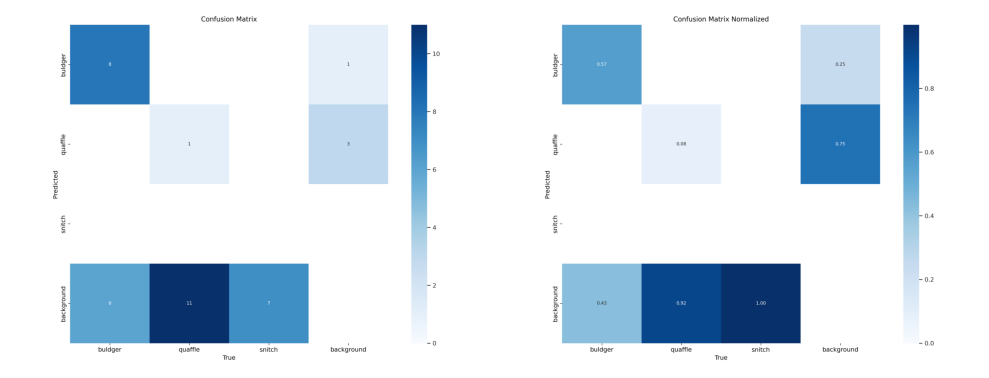

In [ ]:
image_files = ['/content/runs/detect/val/confusion_matrix.png',
               '/content/runs/detect/val/confusion_matrix_normalized.png'
               ]

plot_imgs(image_files, rows=1, cols=2)

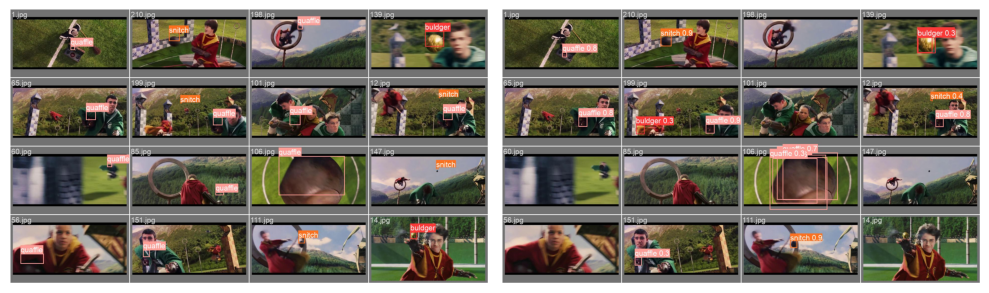

In [ ]:
image_files = ['/content/runs/detect/val/val_batch0_labels.jpg',
               '/content/runs/detect/val/val_batch0_pred.jpg',
            ]

plot_imgs(image_files, rows=1, cols=2)

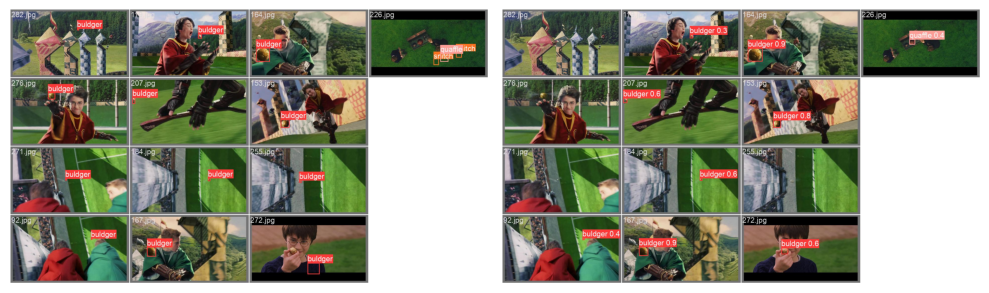

In [ ]:
image_files = ['/content/runs/detect/val/val_batch1_labels.jpg',
               '/content/runs/detect/val/val_batch1_pred.jpg',
            ]

plot_imgs(image_files, rows=1, cols=2)

сохраним полученные результаты

In [ ]:
!zip /content/runs/detect/val.zip /content/runs/detect/val

NotImplementedError: ignored

In [ ]:
# frome here: https://stackoverflow.com/questions/56081324/why-are-google-colab-shell-commands-not-working

import locale

print(locale.getpreferredencoding())

ANSI_X3.4-1968


In [ ]:
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"

locale.getpreferredencoding = getpreferredencoding

In [ ]:
!zip -r /content/runs/detect/val.zip /content/runs/detect/val

updating: content/runs/detect/val/ (stored 0%)
  adding: content/runs/detect/val/confusion_matrix_normalized.png (deflated 31%)
  adding: content/runs/detect/val/val_batch0_pred.jpg (deflated 16%)
  adding: content/runs/detect/val/val_batch1_labels.jpg (deflated 12%)
  adding: content/runs/detect/val/R_curve.png (deflated 17%)
  adding: content/runs/detect/val/PR_curve.png (deflated 19%)
  adding: content/runs/detect/val/val_batch0_labels.jpg (deflated 16%)
  adding: content/runs/detect/val/F1_curve.png (deflated 15%)
  adding: content/runs/detect/val/val_batch1_pred.jpg (deflated 12%)
  adding: content/runs/detect/val/confusion_matrix.png (deflated 36%)
  adding: content/runs/detect/val/P_curve.png (deflated 12%)


In [ ]:
!zip -r /content/runs/detect/train.zip /content/runs/detect/train

updating: content/runs/detect/train/ (stored 0%)
  adding: content/runs/detect/train/train_batch2.jpg (deflated 12%)
  adding: content/runs/detect/train/weights/ (stored 0%)
  adding: content/runs/detect/train/weights/last.pt (deflated 11%)
  adding: content/runs/detect/train/weights/best.pt (deflated 11%)
  adding: content/runs/detect/train/train_batch1.jpg (deflated 12%)
  adding: content/runs/detect/train/confusion_matrix_normalized.png (deflated 32%)
  adding: content/runs/detect/train/val_batch0_pred.jpg (deflated 17%)
  adding: content/runs/detect/train/train_batch1441.jpg (deflated 21%)
  adding: content/runs/detect/train/R_curve.png (deflated 18%)
  adding: content/runs/detect/train/PR_curve.png (deflated 20%)
  adding: content/runs/detect/train/args.yaml (deflated 52%)
  adding: content/runs/detect/train/results.csv (deflated 85%)
  adding: content/runs/detect/train/labels_correlogram.jpg (deflated 47%)
  adding: content/runs/detect/train/train_batch1442.jpg (deflated 23%)
  a

Эти файлы можно в лучшем качестве (чем выше) посмотреть [тут](https://drive.google.com/drive/folders/1rrVCVpl9_FikIHggjsiOPeFt-cGW2f79?usp=sharing)

Хочется добавить комментарии к данному заданию (его оформлению). Видимо отношение автора к этому дз было настолько наплевательским, что ни в одной функции нет докстрингов, которые бы поясняли, что должна делать данная функция, какой формат данных она принимает, и какой формат данных требуется вывести (да господи, хоть даже типизацию бы добавили, это бы уже улучшило понимание того, что просят в каждом задании, но даже это отсутствует). Причем для некоторых функций нет даже примера использования в дальнейшем коде, что просто не дает возможность понять для чего вообще нужна эта функция. Также не понятно зачем писать про YOLOv1 и давать ссылку на статью, если в задании просят сделать совсем другое. Честно, задание составлено ужасно, автору минус в карму(( ..